In [10]:
# import statement from precept_1_python_puzzles.ipynb
import pandas as pd

import numpy as np

# coorelation imports and heat map code form precept_3_EDA_Iris_Dataset.ipynb
import seaborn as sns

# read in the precut data into a pandas dataframe
dataframe = pd.read_csv('2025_PU_clarke-3/peach-data-1f.csv')

# Data clean, ref: updated_precept_4_regression.ipynb
peach_df = dataframe.dropna()
# ref: precept_3_EDA_Iris_Dataset.ipynb

# print(peach_df)

# ref: updated_precept_4_regression.ipynb
# consider average force, average boat speed
force = peach_df['Average Power'].values
speed = peach_df['AvgBoatSpeed'].values

# ref: updated_precept_4_regression.ipynb
X = peach_df

# remove outliers from the df
def remove_outliers(group):
    # iloc from deprecation warning message
    Q1 = group.quantile(0.25, numeric_only = True).iloc[-2]
    # iloc from deprecation warning message
    Q3 = group.quantile(0.75, numeric_only = True).iloc[-2]
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    #ref: for index https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.index.html
    for i in group.index:
        if float(group['Average Power'][i]) <= lower_bound or float(group['Average Power'][i]) >= upper_bound:
            # ref: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html
            group.drop(i, axis='index')
    return group


numeric_columns = peach_df.select_dtypes(include=[np.number]).columns
df_clean = peach_df.copy()

# remove force outliers
df_clean = remove_outliers(df_clean)


peach_df = df_clean.dropna()
        

X_df = pd.DataFrame(X)
force_df = pd.DataFrame(force)
speed_df = pd.DataFrame(speed)
peach_features = pd.merge(X_df, force_df, how='cross')
# print(peach_features)

# heat map code from precept_3_EDA_Iris_Dataset.ipynb
import matplotlib.pyplot as plt
correlation = peach_features.corr()
plt.figure(figsize=(200, 100))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.show()

# split into testing and training data, ref: updated_precept_4_regression.ipynb
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, force, test_size=0.3)

Here we can see that the average power is positively coorelated to the swivel power, max angle, drive start, rower swivel power, drive time, recovery time, angle max, work Q4.

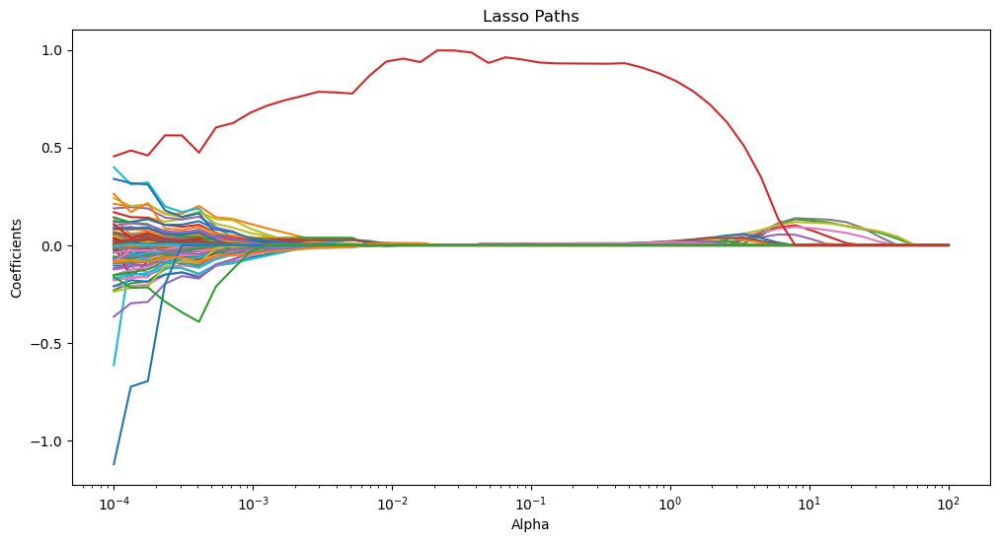

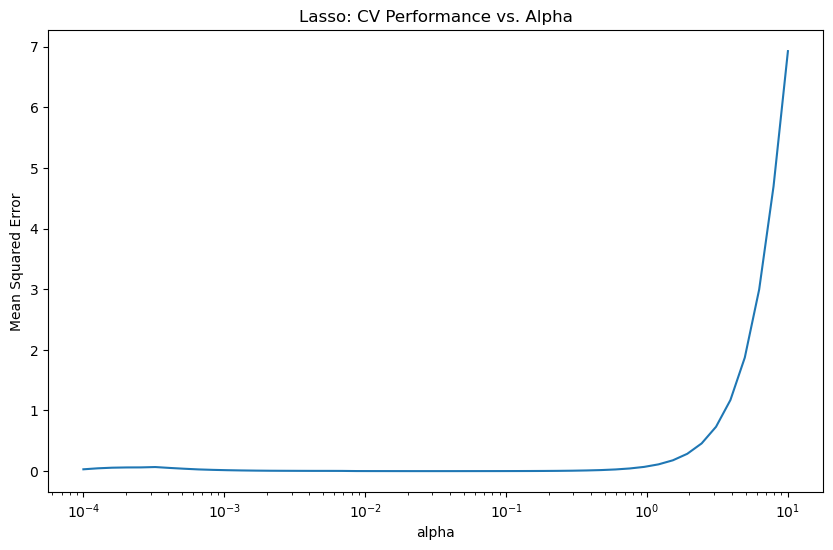

Selected features: ['Time', 'SwivelPower.1', 'SwivelPower.2', 'SwivelPower.3', 'SwivelPower.4', 'SwivelPower.5', 'SwivelPower.6', 'SwivelPower.7', 'Rower Swivel Power', 'Rower Swivel Power.1', 'Rower Swivel Power.2', 'Rower Swivel Power.6', 'Average Power']
Feature 0: 0.0000
Feature 2: 0.0123
Feature 3: 0.0318
Feature 4: 0.0391
Feature 5: 0.0080
Feature 6: 0.0506
Feature 7: 0.0290
Feature 8: 0.0596
Feature 49: 0.0181
Feature 50: 0.0536
Feature 51: 0.0268
Feature 55: 0.0381
Feature 133: 0.5107
Selected features: ['Time', 'SwivelPower', 'SwivelPower.1', 'SwivelPower.2', 'SwivelPower.3', 'SwivelPower.4', 'SwivelPower.5', 'SwivelPower.6', 'SwivelPower.7', 'MinAngle.1', 'MinAngle.2', 'MinAngle.3', 'MinAngle.4', 'MinAngle.5', 'MinAngle.7', 'CatchSlip', 'CatchSlip.1', 'CatchSlip.2', 'CatchSlip.4', 'CatchSlip.5', 'CatchSlip.6', 'CatchSlip.7', 'MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7', 'FinishSlip', 'FinishSlip.1', 'FinishSlip.2

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.522e+00, tolerance: 9.031e-01
  model = cd_fast.enet_coordinate_descent(


In [2]:
# Lasso Feature selection

# Lasso Regression from sklearn ref: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html#sklearn.linear_model.Lasso and precept_5_more_regression-2.ipynb
# import statements from precept_5_more_regression-2.ipynb
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Lasso Feature selection from precept_5_more_regression-2.ipynb Lasso for feature selection section

# Standardize features
scaler = StandardScaler()

# Perform Lasso with different alpha values
alphas = np.logspace(-4, 2, 50)
coefs = []

for alpha in alphas:
    lasso = Lasso(alpha=alpha, max_iter=10000)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)

# Plot the Lasso paths
plt.figure(figsize=(12, 6))
plt.plot(alphas, coefs)
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Coefficients')
plt.title('Lasso Paths')
plt.axis('tight')
plt.show()

# import statement from precept_5_more_regression-2.ipynb
from sklearn.model_selection import cross_val_score

# cross validation score from precept_5_more_regression-2.ipynb
# 4. Cross-validation performance
def plot_cv_performance(X, y):
    alphas = np.logspace(-4, 1, 50)
    lasso_cv_scores = []
    for alpha in alphas:
        lasso = Lasso(alpha=alpha, max_iter=20000)
        scores = cross_val_score(lasso, X, y, cv=5, scoring='neg_mean_squared_error')
        lasso_cv_scores.append(-scores.mean())
    
    plt.figure(figsize=(10, 6))
    plt.semilogx(alphas, lasso_cv_scores)
    plt.xlabel('alpha')
    plt.ylabel('Mean Squared Error')
    plt.title('Lasso: CV Performance vs. Alpha')
    plt.show()

plot_cv_performance(X_df, force_df)

# Select features using Lasso with a specific alpha
alpha_optimal = 2.5 # You may want to choose this value based on cross-validation
lasso_selector = Lasso(alpha=alpha_optimal)
lasso_selector.fit(X_train, y_train)

# Get selected features
selected_features = np.where(lasso_selector.coef_ != 0)[0]
selected_features_names = []
for index in range(len(selected_features)):
    selected_features_names.append(X_train.columns[selected_features[index]])

print("Selected features:", selected_features_names)

# Print coefficients of selected features
for feature, coef in zip(selected_features, lasso_selector.coef_[selected_features]):
    print(f"Feature {feature}: {coef:.4f}")


# Select with lower alpha
# Select features using Lasso with a specific alpha
alpha_optimal = 0.0007 # You may want to choose this value based on cross-validation
lasso_selector = Lasso(alpha=alpha_optimal)
lasso_selector.fit(X_train, y_train)

# Get selected features
selected_features = np.where(lasso_selector.coef_ != 0)[0]
selected_features_names = []
for index in range(len(selected_features)):
    selected_features_names.append(X_train.columns[selected_features[index]])

print("Selected features:", selected_features_names)

# Print coefficients of selected features
for feature, coef in zip(selected_features, lasso_selector.coef_[selected_features]):
    print(f"Feature {feature}: {coef:.4f}")



Mean Square Error Training Data:  49.36187141613151
R2 score train data:  0.46980825465597853
Mean Square Error Test Data:  61.67113777943861
R2 score test data:  0.09627348211926112


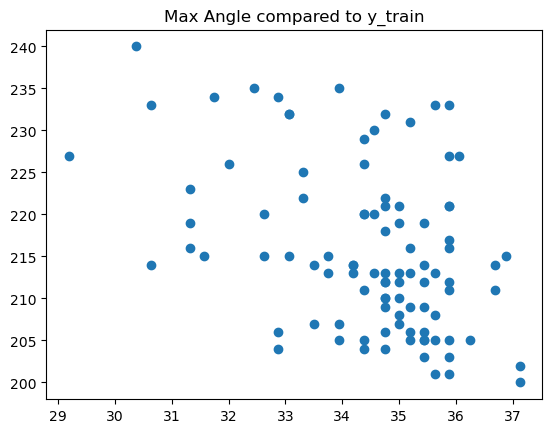

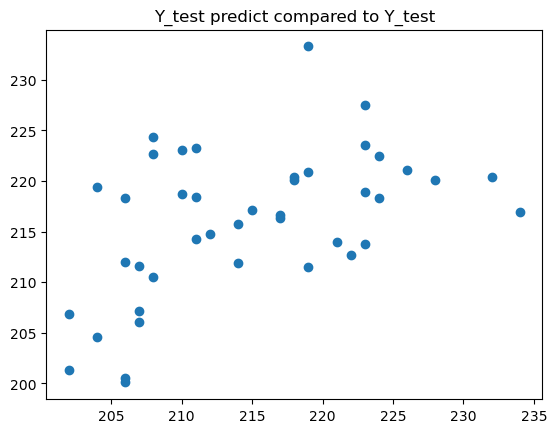

In [4]:
# linear regression ref: updated_precept_4_regression.ipynb
from sklearn.linear_model import LinearRegression

# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_train_max_angle = X_train[['MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7']]

for i in range(len(y_train)):
    y_train[i] = float(y_train[i])

# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_test_force = X_test[['MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7']]


plt.figure()
plt.title("Max Angle compared to y_train")
plt.scatter(X_train_max_angle['MaxAngle'], y_train)
plt.plot()

force_model = LinearRegression()
force_model.fit(X_train_max_angle, y_train)
y_train_predict = force_model.predict(X_train_max_angle)
y_predict = force_model.predict(X_test_force)

import matplotlib.pyplot as plt

for i in range(len(y_test)):
    y_test[i] = float(y_test[i])

plt.figure()
plt.title("Y_test predict compared to Y_test")
plt.scatter(y_test, y_predict)
plt.plot()

# ref: import from precept_5_more-regression-2.ipynb
from sklearn.metrics import mean_squared_error, r2_score

# ref: metrics from precept_5_more_regression-2.ipynb
mse_linear_train = mean_squared_error(y_train, y_train_predict)
r2_linear_train = r2_score(y_train, y_train_predict)
mse_linear_test = mean_squared_error(y_test, y_predict)
r2_linear_test = r2_score(y_test, y_predict)

print("Mean Square Error Training Data: ", mse_linear_train)
print("R2 score train data: ", r2_linear_train)
print("Mean Square Error Test Data: ", mse_linear_test)
print("R2 score test data: ", r2_linear_test)



Mean Square Error Training Data:  48.38750889524856
R2 score train data:  0.48027380125549224
Mean Square Error Test Data:  40.78658827346745
R2 score test data:  0.4023148797993257
Force Model: 410.27766187490073 + 0.4745686836529747b_1 + 2.166428521325332b_2 + 0.6782912566343463b_3 + -0.8894654771966927b_4 + -3.9726801891551875b_5 + -0.37651615927695065b_6 + -1.8480423043356697b_7 + 0.3589235905657873b_8


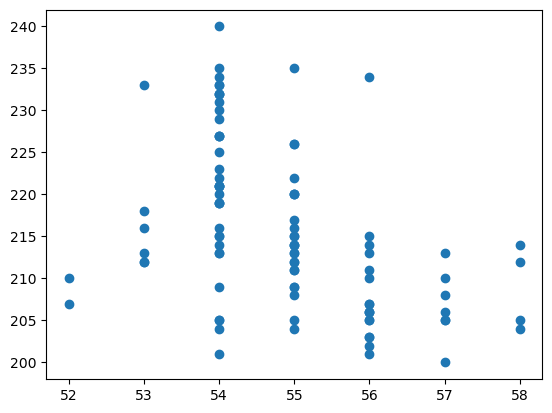

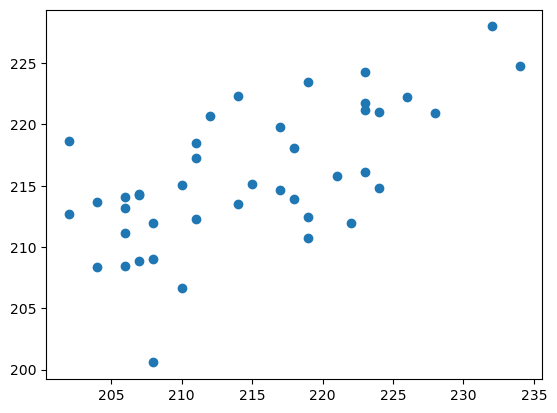

In [5]:
# linear regression ref: updated_precept_4_regression.ipynb
from sklearn.linear_model import LinearRegression

# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_train_max_angle = X_train[['Drive Start T', 'Drive Start T.1', 'Drive Start T.2', 'Drive Start T.3', 'Drive Start T.4', 'Drive Start T.5', 'Drive Start T.6', 'Drive Start T.7']]

# ref: loc method precept_1_python_puzzles.ipynb

for i in range(len(y_train)):
    y_train[i] = float(y_train[i])

# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_test_force = X_test[['Drive Start T', 'Drive Start T.1', 'Drive Start T.2', 'Drive Start T.3', 'Drive Start T.4', 'Drive Start T.5', 'Drive Start T.6', 'Drive Start T.7']]


plt.figure()
plt.scatter(X_train_max_angle['Drive Start T'], y_train)
plt.plot()

force_model = LinearRegression()
force_model.fit(X_train_max_angle, y_train)
y_train_predict = force_model.predict(X_train_max_angle)
y_predict = force_model.predict(X_test_force)

import matplotlib.pyplot as plt

for i in range(len(y_test)):
    y_test[i] = float(y_test[i])

plt.figure()
plt.scatter(y_test, y_predict)
plt.plot()

# ref: import from precept_5_more-regression-2.ipynb
from sklearn.metrics import mean_squared_error, r2_score

# ref: metrics from precept_5_more_regression-2.ipynb
mse_linear_train = mean_squared_error(y_train, y_train_predict)
r2_linear_train = r2_score(y_train, y_train_predict)
mse_linear_test = mean_squared_error(y_test, y_predict)
r2_linear_test = r2_score(y_test, y_predict)

print("Mean Square Error Training Data: ", mse_linear_train)
print("R2 score train data: ", r2_linear_train)
print("Mean Square Error Test Data: ", mse_linear_test)
print("R2 score test data: ", r2_linear_test)

print(f"Force Model: {force_model.intercept_} + {force_model.coef_[0]}b_1 + {force_model.coef_[1]}b_2 + {force_model.coef_[2]}b_3 + {force_model.coef_[3]}b_4 + {force_model.coef_[4]}b_5 + {force_model.coef_[5]}b_6 + {force_model.coef_[6]}b_7 + {force_model.coef_[7]}b_8")

Mean Square Error Training Data:  43.07202741468249
R2 score train data:  0.5373669446609943
Mean Square Error Test Data:  31.813362422875848
R2 score test data:  0.5338081916482966
Cooefficent [-66.9117951]


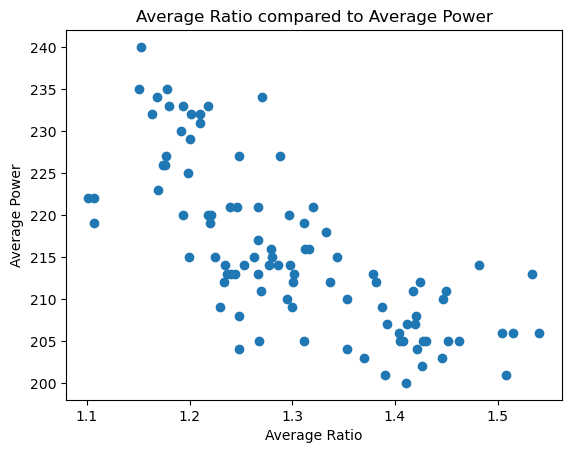

In [6]:
# linear regression ref: updated_precept_4_regression.ipynb
from sklearn.linear_model import LinearRegression

# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_train_drive = X_train[['Drive Time', 'Drive Time.1', 'Drive Time.2', 'Drive Time.3', 'Drive Time.4', 'Drive Time.5', 'Drive Time.6', 'Drive Time.7']]
X_train_recover = X_train[['Recovery Time', 'Recovery Time.1', 'Recovery Time.2', 'Recovery Time.3', 'Recovery Time.4', 'Recovery Time.5', 'Recovery Time.6', 'Recovery Time.7']]


ratio_array = np.zeros((len(X_train_drive), 8))

for i in range(8):
    for j in range(len(X_train_drive)):
        # ref: iloc method precept_1_python_puzzles.ipynb
        ratio_array[j, i] = X_train_recover.iloc[j, i] / X_train_drive.iloc[j, i]


# find the avergae ratio of the boat over a stroke
avg_ratio_array = np.zeros(len(X_train_drive))
for j in range(len(X_train_drive)):
    avg_ratio_array[j] = np.mean(ratio_array[j, 0:8])

X_train_ratio = pd.DataFrame(avg_ratio_array, columns=['Avg Ratio'])

for i in range(len(y_train)):
    y_train[i] = float(y_train[i])


# find the test ratio
# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_test_drive = X_test[['Drive Time', 'Drive Time.1', 'Drive Time.2', 'Drive Time.3', 'Drive Time.4', 'Drive Time.5', 'Drive Time.6', 'Drive Time.7']]
X_test_recover = X_test[['Recovery Time', 'Recovery Time.1', 'Recovery Time.2', 'Recovery Time.3', 'Recovery Time.4', 'Recovery Time.5', 'Recovery Time.6', 'Recovery Time.7']]
ratio_array_test = np.zeros((len(X_test_drive), 8))

for i in range(8):
    for j in range(len(X_test_drive)):
        # ref: iloc method precept_1_python_puzzles.ipynb
        ratio_array_test[j, i] = X_test_recover.iloc[j, i] / X_test_drive.iloc[j, i]

# find the average ratio for the boat per stroke
avg_ratio_array_test = np.zeros(len(X_test_drive))
for j in range(len(X_test_drive)):
    avg_ratio_array_test[j] = np.mean(ratio_array_test[j, 0:8])

X_test_ratio = pd.DataFrame(avg_ratio_array_test, columns=['Avg Ratio'])


plt.figure()
plt.title("Average Ratio compared to Average Power")
plt.xlabel("Average Ratio")
plt.ylabel("Average Power")
plt.scatter(X_train_ratio['Avg Ratio'], y_train)
plt.plot()

ratio_model = LinearRegression()
ratio_model.fit(X_train_ratio, y_train)
y_train_predict = ratio_model.predict(X_train_ratio)
y_predict = ratio_model.predict(X_test_ratio)

import matplotlib.pyplot as plt

for i in range(len(y_test)):
    y_test[i] = float(y_test[i])

# ref: import from precept_5_more-regression-2.ipynb
from sklearn.metrics import mean_squared_error, r2_score

# ref: metrics from precept_5_more_regression-2.ipynb
mse_linear_train = mean_squared_error(y_train, y_train_predict)
r2_linear_train = r2_score(y_train, y_train_predict)
mse_linear_test = mean_squared_error(y_test, y_predict)
r2_linear_test = r2_score(y_test, y_predict)

print("Mean Square Error Training Data: ", mse_linear_train)
print("R2 score train data: ", r2_linear_train)
print("Mean Square Error Test Data: ", mse_linear_test)
print("R2 score test data: ", r2_linear_test)
print("Cooefficent", ratio_model.coef_)

In [ ]:
# Model for comparing the Drive Start, catch slip, max angle, finish slip

# linear regression ref: updated_precept_4_regression.ipynb
from sklearn.linear_model import LinearRegression

# calculate the variance of the drive time for the training data
# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_train_drive_start = X_train[['Drive Start T', 'Drive Start T.1', 'Drive Start T.2', 'Drive Start T.3', 'Drive Start T.4', 'Drive Start T.5', 'Drive Start T.6', 'Drive Start T.7']]
X_train_catch_slip = X_train[['CatchSlip', 'CatchSlip.1', 'CatchSlip.2', 'CatchSlip.3', 'CatchSlip.4', 'CatchSlip.5', 'CatchSlip.6', 'CatchSlip.7']]
X_train_max_angle = X_train[['MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7']]
X_train_finish_slip = X_train[['FinishSlip', 'FinishSlip.1', 'FinishSlip.2', 'FinishSlip.3', 'FinishSlip.4', 'FinishSlip.5', 'FinishSlip.6', 'FinishSlip.7']]

X_train_combined = X_train[[ 'CatchSlip', 'CatchSlip.1', 'CatchSlip.2', 'CatchSlip.3', 'CatchSlip.4', 'CatchSlip.5', 'CatchSlip.6', 'CatchSlip.7', 'MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7', 'FinishSlip', 'FinishSlip.1', 'FinishSlip.2', 'FinishSlip.3', 'FinishSlip.4', 'FinishSlip.5', 'FinishSlip.6', 'FinishSlip.7']]

# ref: loc method precept_1_python_puzzles.ipynb
start_time_array = np.zeros(len(X_train_drive_start))

for i in range(len(X_train_drive_start)):
    # ref: iloc method precept_1_python_puzzles.ipynb
    start_time_array[i] = np.var(X_train_drive_start.iloc[i, 0:8])

X_train_combined.insert(0, 'Drive Variance', start_time_array)

# ref: selecting multiple columns in a panda data frame from precept_1_python_puzzle.ipynb
X_test_drive_start = X_test[['Drive Start T', 'Drive Start T.1', 'Drive Start T.2', 'Drive Start T.3', 'Drive Start T.4', 'Drive Start T.5', 'Drive Start T.6', 'Drive Start T.7']]
X_test_catch_slip = X_test[['CatchSlip', 'CatchSlip.1', 'CatchSlip.2', 'CatchSlip.3', 'CatchSlip.4', 'CatchSlip.5', 'CatchSlip.6', 'CatchSlip.7']]
X_test_max_angle = X_test[['MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7']]
X_test_finish_slip = X_test[['FinishSlip', 'FinishSlip.1', 'FinishSlip.2', 'FinishSlip.3', 'FinishSlip.4', 'FinishSlip.5', 'FinishSlip.6', 'FinishSlip.7']]

X_test_combined = X_test[[ 'CatchSlip', 'CatchSlip.1', 'CatchSlip.2', 'CatchSlip.3', 'CatchSlip.4', 'CatchSlip.5', 'CatchSlip.6', 'CatchSlip.7', 'MaxAngle', 'MaxAngle.1', 'MaxAngle.2', 'MaxAngle.3', 'MaxAngle.4', 'MaxAngle.5', 'MaxAngle.6', 'MaxAngle.7', 'FinishSlip', 'FinishSlip.1', 'FinishSlip.2', 'FinishSlip.3', 'FinishSlip.4', 'FinishSlip.5', 'FinishSlip.6', 'FinishSlip.7']]

# ref: loc method precept_1_python_puzzles.ipynb
start_time_test_array = np.zeros(len(X_test_drive_start))

for i in range(len(X_test_drive_start)):
    # ref: iloc method precept_1_python_puzzles.ipynb
    start_time_test_array[i] = np.var(X_test_drive_start.iloc[i, 0:8])

X_test_combined.insert(0, 'Drive Variance', start_time_test_array)

# model for predicting average power based on the features above

# linear regression ref: updated_precept_4_regression.ipynb
drive_start_model = LinearRegression()
drive_start_model.fit(X_train_combined, y_train)
y_train_predict = drive_start_model.predict(X_train_combined)
y_predict = drive_start_model.predict(X_test_combined)

# ref: metrics from precept_5_more_regression-2.ipynb
mse_linear_train = mean_squared_error(y_train, y_train_predict)
r2_linear_train = r2_score(y_train, y_train_predict)
mse_linear_test = mean_squared_error(y_test, y_predict)
r2_linear_test = r2_score(y_test, y_predict)

print("Mean Square Error Training Data: ", mse_linear_train)
print("R2 score train data: ", r2_linear_train)
print("Mean Square Error Test Data: ", mse_linear_test)
print("R2 score test data: ", r2_linear_test)


Mean Square Error Training Data:  17.73271803381478
R2 score train data:  0.8095343540607911
Mean Square Error Test Data:  35.96472869618104
R2 score test data:  0.4729742274681762
